# Satellite Imagery Patch Extractor


**Notes**:
- This example uses [Sentinel-2 Level-2A data](https://planetarycomputer.microsoft.com/dataset/sentinel-2-l2a). The techniques used here apply equally well to other remote-sensing datasets.
- If you're running this on the [Planetary Computer Hub](http://planetarycomputer.microsoft.com/compute), make sure to choose the **GPU - PyTorch** profile when presented with the form to choose your environment.

In [1]:
import warnings
import time
import os

RASTERIO_BEST_PRACTICES = dict(  # See https://github.com/pangeo-data/cog-best-practices
    CURL_CA_BUNDLE="/etc/ssl/certs/ca-certificates.crt",
    GDAL_DISABLE_READDIR_ON_OPEN="EMPTY_DIR",
    AWS_NO_SIGN_REQUEST="YES",
    GDAL_MAX_RAW_BLOCK_CACHE_SIZE="200000000",
    GDAL_SWATH_SIZE="200000000",
    VSI_CURL_CACHE_SIZE="200000000",
)
os.environ.update(RASTERIO_BEST_PRACTICES)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torchvision.transforms.functional as F
from torch.utils.data import Dataset, DataLoader

import rasterio
import rasterio.warp
import rasterio.mask
import shapely.geometry
import geopandas as gpd
import dask_geopandas
# from dask.distributed import Client
# from dask_gateway import GatewayCluster

import pystac_client
import planetary_computer as pc
from dask.distributed import Client, progress
import rioxarray

In [2]:
from typing import Any, Optional, Union, TYPE_CHECKING
# if TYPE_CHECKING:
import numpy.typing as npt

Coordinates = tuple[float, float]
Patch = npt.NDArray[np.float32]


In [30]:
## Set Resolution for Sentinel-2 images
sentinel2_metadata = {
    'visual' : {'resolution' : 10, 'bits' : 16},
    'B08' : {'resolution' : 10, 'bits' : 16},
    'crs' : 'epsg:4326'
}

# import dask_gateway

## This will be used for both training and testing in different configurations:
# Train : centroids are always the centroid of the grids
# Test : centroids will be the points at which we will be sampling to test
class SIPatchExtractor(object):
    """
    Handles the loading and extraction of an environmental tensor from multiple rasters given GPS coordinates.
    """
    
#     global cluster_options, cluster, client, gateway
    
    dask_geopandas_partitions = 250
    
    
    def _query(self, points):
        """
        Find a STAC item for points in the `points` DataFrame

        Parameters
        ----------
        points : geopandas.GeoDataFrame
            A GeoDataFrame

        Returns
        -------
        geopandas.GeoDataFrame
            A new geopandas.GeoDataFrame with a `stac_item` column containing the STAC
            item that covers each point.
        """
        intersects = shapely.geometry.mapping(points.unary_union.convex_hull) #TODO replace with rectangular geometry

        search_start = "2018-01-01"
        search_end = "2019-12-31"
        catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1",
                                            modifier=pc.sign_inplace)
        # catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

        # The time frame in which we search for non-cloudy imagery
        search = catalog.search(
            collections=["sentinel-2-l2a"],
            intersects=intersects,
            datetime=[search_start, search_end],
            query={"eo:cloud_cover": {"lt": 10}},
            limit=500,
        )
        ic = search.get_all_items_as_dict()

        features = ic["features"]
        features_d = {item["id"]: item for item in features}

        data = {
            "eo:cloud_cover": [],
            "geometry": [],
        }

        index = []

        for item in features:
            data["eo:cloud_cover"].append(item["properties"]["eo:cloud_cover"])
            data["geometry"].append(shapely.geometry.shape(item["geometry"]))
            index.append(item["id"])

        items = gpd.GeoDataFrame(data, index=index, geometry="geometry").sort_values(
            "eo:cloud_cover"
        )
        point_list = points.geometry.tolist()

        point_items = []
        for point in point_list:
            covered_by = items[items.covers(point)]
            if len(covered_by):
                point_items.append(features_d[covered_by.index[0]])
            else:
                # There weren't any scenes matching our conditions for this point (too cloudy)
                point_items.append(None)

        return points.assign(stac_item=point_items)



    def __init__(self, centroids: gpd.GeoDataFrame, side_length_m:int=1000, side_px:int=64):
        """Constructor

        Parameters
        ----------
        centroids : a geopandas frame with 4 columns:
            grid_id, lons, lats, geometry (of the centroid)
            In Train mode, these coordinates are centroids,
            In Test mode, these would be the coordinates of observations
            
        side_length_m : integer
            Size in meters (side_length_m x side_length_m) of the patches to extract around each location.
            
        side_px : integer
            Size in pixels of the image patch output
        """
        assert(len(centroids.columns) == 4)
        
        self.side_length = side_length_m
        self.side_px = side_px
        self.points = np.array(centroids[['lon','lat']])
        self.centroids = centroids.copy()

        
 
        print("Organizing grid centroids according to Hilbert distance...")
        
        ddf = dask_geopandas.from_geopandas(self.centroids, npartitions=1)
        hd = ddf.hilbert_distance().compute()
        self.centroids["hd"] = hd
        self.centroids = self.centroids.sort_values("hd")
        dgdf = dask_geopandas.from_geopandas(self.centroids, npartitions=self.dask_geopandas_partitions, sort=False)
        
        
        print("Get the URLs of all the Sentinel-2 images to extract from ...")

        # with Client(n_workers=16) as client:
        #     print(client.dashboard_link)
        #     meta = dgdf._meta.assign(stac_item=[])
        #     df2 = dgdf.map_partitions(self._query, meta=meta).compute()
            
        from dask_gateway import GatewayCluster
        cluster = GatewayCluster()  # Creates the Dask Scheduler. Might take a minute.
        client = cluster.get_client()
        cluster.adapt(minimum=4, maximum=113)
        
        print(cluster.dashboard_link)
        print(client)
        
        meta = dgdf._meta.assign(stac_item=[])
        df2 = dgdf.map_partitions(self._query, meta=meta).compute()

        
        self.data = df2.dropna(subset=["stac_item"])
        #Save it as a tuple -> (RGB,NIR)
        self.data['urls'] = [(item["assets"]["visual"]["href"], item["assets"]["B08"]["href"]) for item in self.data.stac_item.tolist()]
        self.data['crs']  = [item["properties"]["proj:epsg"] for item in self.data.stac_item.tolist()]
        print(self.data.stac_item[0]["properties"]["proj:epsg"])
        print("{} URLs acquired. Shutting Down Cluster".format(len(self.data)))
        cluster.close()

    

    def clean(self) -> None:
        """Remove all rasters from the extractor."""
        # self.rasters_fr = []
        self.data = None
        # self.matching_urls = []


    def __repr__(self) -> str:
        return str(self)


    def __getitem__(self, idx:int=-1): #, coordinates: Coordinates) -> npt.NDArray[np.float32]:
        """Extracts the patches around the given GPS coordinates for all the previously loaded rasters.

        Parameters
        ----------
        coordinates : tuple containing two floats
            GPS coordinates (latitude, longitude)
        idx : int containing the grid id of the patch in question
            **Used only in training mode**
            **-1 for test mode**
        
        Returns
        -------
        patch : 3d array of floats, [n_rasters, size, size]
            Extracted patches around the given coordinates.
        """


        if (idx > -1):
            lon, lat = self.data.lon[idx], self.data.lat[idx]
            fn_RGB = self.data.urls[idx][0]
            fn_NIR = self.data.urls[idx][1]
        ##TODO
        else: #Test mode where a gps coordinates are entered (prob not required)
            idx = 0 # do something dumb for now
            
            
            
        mask_geom = None
        t_rgb = None
        t_nir = None

        if fn_RGB is None or fn_NIR is None:
            print("URLS are messed up. Aborting")
            return None
        else:
            point_geom = shapely.geometry.mapping(shapely.geometry.Point(lon, lat))

            #RGB
            
            with rasterio.Env():
                with rasterio.open(fn_RGB, "r") as f:
                    #Save the CRS for later analysis
                    # self.data.crs[idx] = f.crs.to_string()
                    # Grid points are in 4326 -> move to 32610
                    point_geom = rasterio.warp.transform_geom("epsg:4326", f.crs.to_string(), point_geom)
                    
                    #Convert the point to a shape
                    point_shape = shapely.geometry.shape(point_geom)
                    #Create a square out of it with side_length = buffer*2
                    mask_shape = point_shape.buffer(self.side_length/2).envelope
                    mask_geom = shapely.geometry.mapping(mask_shape)

                    try:

                        image_rgb = rioxarray.open_rasterio(f).rio.clip([mask_geom], from_disk=True)
                        #TODO Convert to EA projection here:

                        t = torch.from_numpy(image_rgb.values.astype(np.uint8))

                        postprocess = T.Compose ([T.CenterCrop((t.shape[1])),
                                                 T.Resize(self.side_px)])

                        t_rgb = postprocess(t)
                        #otherwise images dont display properly
                        #but uint8 conversion has already taken care of this downresolution
                        # t /= 255 
                        # print(t_rgb.shape, type(t_rgb))

                    except ValueError as e:
                        if "Input shapes do not overlap raster." in str(e):
                            print("Couldnt open RGB URL or requested grid doesnt overlap")
                            return None
            
            
            #NIR
            with rasterio.Env():
                with rasterio.open(fn_NIR, "r") as f:

                    try:

                        image_nir = rioxarray.open_rasterio(f).rio.clip([mask_geom], from_disk=True)
                        t = torch.from_numpy(image_nir.values.astype(np.uint8)) #divides by 255 effectively

                        postprocess = T.Compose ([T.CenterCrop((t.shape[1])),
                                                 T.Resize(self.side_px)])

                        t_nir = postprocess(t)
                        #otherwise images dont display properly
                        #but uint8 conversion has already taken care of this downresolution
                        # t /= 255 
                        # print(t_nir.shape, type(t_nir))

                    except ValueError as e:
                        if "Input shapes do not overlap raster." in str(e):
                            print("Couldnt open NIR URL or requested grid doesnt overlap")
                            return None
            
            
                        
            #Combine the (3,W,H) and (1,W,H) tensors into (4,W,H)
            t_out = torch.cat((t_rgb, t_nir), 0)
            # assert(t_out.shape = (4,self.side_px,self.side_px))
            # out_image = np.vstack((image_rgb, image_nir))
            # out_image = out_image / 255.0

            # print(t_out.shape)
            # assert(out_image.shape )
            
            return t_out

    def __len__(self) -> int:
        """Number of variables/rasters loaded.

        Returns
        -------
        n_rasters : integer
            Number of loaded rasters
        """
        return len(self.data)


    def plot(
        self,
        idx: int):
        """Plot the SI-image tensor (RGB Only)

        Parameters
        ----------
        index

        Returns
        -------
        PIL Image
        """

        tensor = self[idx]
        
        transform = T.ToPILImage()
        image_RGB = transform(tensor[0:3,:,:])
        image_NIR = transform(tensor[3,:,:])
        image_RGB.show()
        image_NIR.show()
        # return (image_RGB, image_NIR)

## 1. Read Sample KDE Files

In [4]:
DATASET_PATH = '../data/full_dataset.csv'
RASTER_PATH = '.'
LABEL_PATH = '../data/labels/ca/'


In [5]:
BUCKET_NAME = 'datasets-sdm'
folder = 'kde/ca'
filename = 'geolifeclef_ca_0.05deg_kde_0.5deg_epanechnikov.pkl'

s3_read_path = 's3://{}/{}/{}'.format(BUCKET_NAME, folder, filename)
print(s3_read_path)

s3://datasets-sdm/kde/ca/geolifeclef_ca_0.05deg_kde_0.5deg_epanechnikov.pkl


In [6]:
kde_gdf = pd.read_pickle(s3_read_path)
kde_gdf.head()

,geometry,grid_id,prob_4911,prob_4912,prob_4922,prob_4923,prob_2329,prob_4927,prob_4930,prob_4382,...,prob_14228,prob_202,prob_9006,prob_272,prob_16726,prob_17029,prob_8230,prob_13366,prob_16533,prob_1455
0,"POLYGON ((-124.36556 40.23088, -124.36556 40.2...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,"POLYGON ((-124.36556 40.28088, -124.36556 40.3...",1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"POLYGON ((-124.36556 40.33088, -124.36556 40.3...",2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"POLYGON ((-124.36556 40.38088, -124.36556 40.4...",3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,"POLYGON ((-124.36556 40.43088, -124.36556 40.4...",4,0,0,24,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Generate a list of centroids -> GPD frame

In [7]:
def create_centroids_gdf(gdf):
    #Convert to equal area projection and back to avoid CRS issues with calculating centroid:
    c = kde_gdf.to_crs('+proj=cea').centroid.to_crs(gdf.crs)

    centroids = pd.DataFrame()
    centroids['grid_id'] = gdf.grid_id
    centroids['lon'] = c.x.values
    centroids['lat'] = c.y.values
    centroids = gpd.GeoDataFrame(centroids, geometry=gpd.points_from_xy(centroids['lon'], centroids['lat']))
    
    return centroids

In [8]:
centroids = create_centroids_gdf(kde_gdf)

kde_gdf['lat'] = centroids['lat']
kde_gdf['lon'] = centroids['lon']
kde_gdf.head()

/srv/conda/envs/notebook/lib/python3.9/site-packages/geopandas/geodataframe.py:1472: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/srv/conda/envs/notebook/lib/python3.9/site-packages/geopandas/geodataframe.py:1472: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)


,geometry,grid_id,prob_4911,prob_4912,prob_4922,prob_4923,prob_2329,prob_4927,prob_4930,prob_4382,...,prob_9006,prob_272,prob_16726,prob_17029,prob_8230,prob_13366,prob_16533,prob_1455,lat,lon
0,"POLYGON ((-124.36556 40.23088, -124.36556 40.2...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,40.255879,-124.390558
1,"POLYGON ((-124.36556 40.28088, -124.36556 40.3...",1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,40.305879,-124.390558
2,"POLYGON ((-124.36556 40.33088, -124.36556 40.3...",2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,40.355879,-124.390558
3,"POLYGON ((-124.36556 40.38088, -124.36556 40.4...",3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,40.405879,-124.390558
4,"POLYGON ((-124.36556 40.43088, -124.36556 40.4...",4,0,0,24,0,0,0,0,0,...,0,0,0,0,0,0,0,0,40.455879,-124.390558


In [9]:
centroids.head()

,grid_id,lon,lat,geometry
0,0,-124.390558,40.255879,POINT (-124.39056 40.25588)
1,1,-124.390558,40.305879,POINT (-124.39056 40.30588)
2,2,-124.390558,40.355879,POINT (-124.39056 40.35588)
3,3,-124.390558,40.405879,POINT (-124.39056 40.40588)
4,4,-124.390558,40.455879,POINT (-124.39056 40.45588)


<AxesSubplot:>

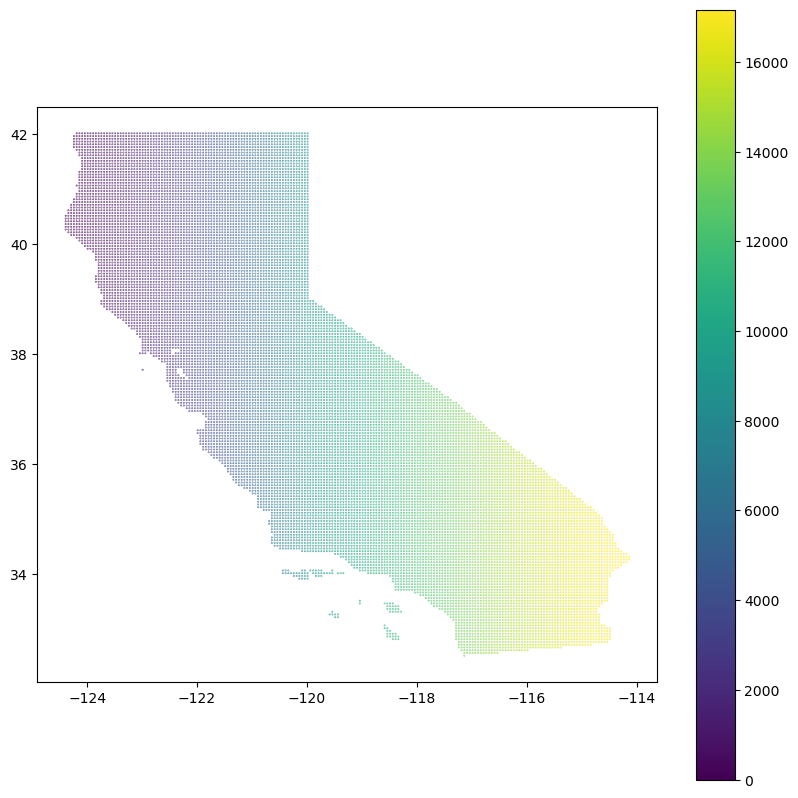

In [26]:
fig, ax = plt.subplots(figsize=(10,10))
# edgecolor = 'tab:green'
centroids.plot(column='grid_id', alpha=1, ax=ax, markersize=0.1, legend=True)

# Extract features from the imagery around each point

In [31]:
Sentinel_Images = SIPatchExtractor(centroids, side_length_m=5000, side_px=256)

Organizing grid centroids according to Hilbert distance...
Get the URLs of all the Sentinel-2 images to extract from ...
https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.eb2e9ee30aa848ce9fea6969ac647ffa/status
<Client: 'tls://10.244.226.20:8786' processes=0 threads=0, memory=0 B>


2022-11-29 19:33:57,933 - distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {"('_query-8e7d4b4c93e2e0d8ca4e0f0960764a6f', 93)": ()}


32610
17173 URLs acquired. Shutting Down Cluster


In [28]:
print(len(Sentinel_Images))
assert(len(Sentinel_Images) == len(centroids))

17173


In [32]:
Sentinel_Images.data

,grid_id,lon,lat,geometry,hd,stac_item,urls,crs
9443,9443,-119.590558,33.25588,POINT (-119.59056 33.25588),372242744,{'id': 'S2B_MSIL2A_20181103T184529_R070_T11SKS...,(https://sentinel2l2a01.blob.core.windows.net/...,32611
9623,9623,-119.490558,33.20588,POINT (-119.49056 33.20588),373869904,{'id': 'S2B_MSIL2A_20181103T184529_R070_T11SKS...,(https://sentinel2l2a01.blob.core.windows.net/...,32611
9712,9712,-119.440558,33.20588,POINT (-119.44056 33.20588),374028282,{'id': 'S2B_MSIL2A_20181103T184529_R070_T11SKS...,(https://sentinel2l2a01.blob.core.windows.net/...,32611
9713,9713,-119.440558,33.25588,POINT (-119.44056 33.25588),376791449,{'id': 'S2B_MSIL2A_20181103T184529_R070_T11SKS...,(https://sentinel2l2a01.blob.core.windows.net/...,32611
9624,9624,-119.490558,33.25588,POINT (-119.49056 33.25588),376869273,{'id': 'S2B_MSIL2A_20181103T184529_R070_T11SKS...,(https://sentinel2l2a01.blob.core.windows.net/...,32611
...,...,...,...,...,...,...,...,...
17036,17036,-114.590558,32.80588,POINT (-114.59056 32.80588),4286249368,{'id': 'S2A_MSIL2A_20191008T182241_R127_T11SQS...,(https://sentinel2l2a01.blob.core.windows.net/...,32611
17071,17071,-114.540558,32.80588,POINT (-114.54056 32.80588),4286316856,{'id': 'S2A_MSIL2A_20191008T182241_R127_T11SQS...,(https://sentinel2l2a01.blob.core.windows.net/...,32611
17072,17072,-114.540558,32.85588,POINT (-114.54056 32.85588),4286397527,{'id': 'S2A_MSIL2A_20191008T182241_R127_T11SQS...,(https://sentinel2l2a01.blob.core.windows.net/...,32611
17104,17104,-114.490558,32.85588,POINT (-114.49056 32.85588),4286459645,{'id': 'S2A_MSIL2A_20191008T182241_R127_T11SQS...,(https://sentinel2l2a01.blob.core.windows.net/...,32611


In [26]:
Sentinel_Images.data.stac_item[99]['properties']['proj:epsg']

32610

In [138]:
Sentinel_Images[0].shape

torch.Size([3, 256, 256]) <class 'torch.Tensor'>
torch.Size([1, 256, 256]) <class 'torch.Tensor'>
torch.Size([4, 256, 256])


torch.Size([4, 256, 256])

In [139]:
Sentinel_Images.data.urls[1000][0]
Sentinel_Images.data.lon[1000], Sentinel_Images.data.lat[1000]

(-123.34055786132818, 41.1058790963565)

## Display some images for sanity checking

## Find closest Centroid to berkeley

In [14]:
from shapely.geometry import Point

berkeley = Point(-122.2629862,37.8879003)
random_ca = Point(-124.36556, 40.23088)
# centroids.sindex.nearest(random_ca)
idx_berkeley = centroids.sindex.nearest(berkeley)[1][0]

In [15]:
centroids.iloc[idx_berkeley]

grid_id                                              2776
lon                                           -122.240558
lat                                              37.90588
geometry    POINT (-122.24055786132824 37.90587960532352)
Name: 2776, dtype: object

torch.Size([3, 256, 256]) <class 'torch.Tensor'>
torch.Size([1, 256, 256]) <class 'torch.Tensor'>
torch.Size([4, 256, 256])


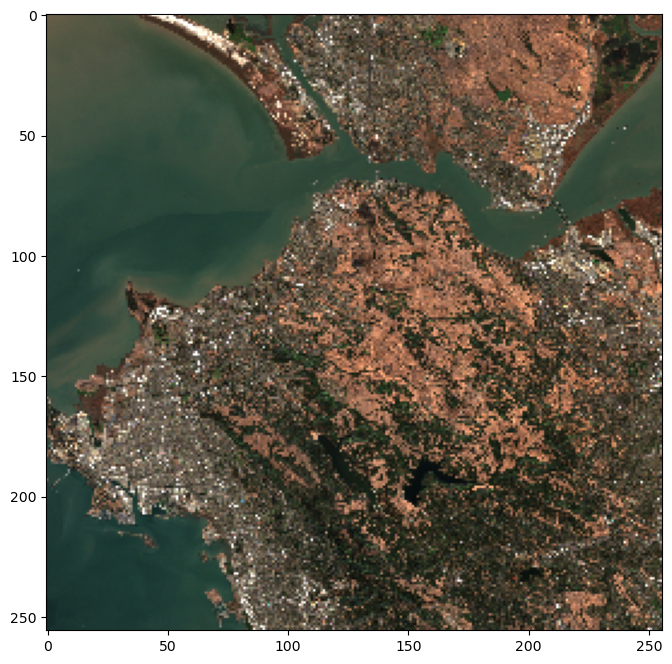

In [143]:
tensor = Sentinel_Images[idx_berkeley]
transform = T.ToPILImage()
image = transform(tensor[0:3,:,:])
# image = transform(tensor)
plt.figure(figsize=(8,8))
plt.imshow(image)

torch.Size([3, 256, 256]) <class 'torch.Tensor'>
torch.Size([1, 256, 256]) <class 'torch.Tensor'>
torch.Size([4, 256, 256])


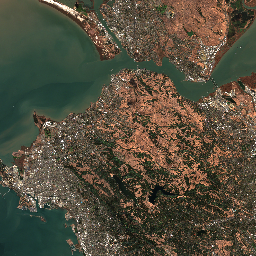

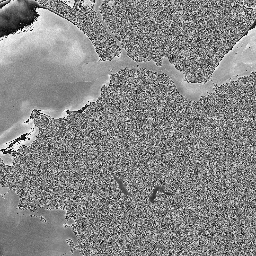

In [140]:
Sentinel_Images.plot(idx_berkeley)

In [46]:
Sentinel_Images.data.iloc[idx_berkeley].urls

('https://sentinel2l2a01.blob.core.windows.net/sentinel2-l2/10/S/EH/2019/11/21/S2B_MSIL2A_20191121T185659_N0212_R113_T10SEH_20201003T184646.SAFE/GRANULE/L2A_T10SEH_A014153_20191121T190140/IMG_DATA/R10m/T10SEH_20191121T185659_TCI_10m.tif?st=2022-11-27T23%3A55%3A49Z&se=2022-11-29T07%3A55%3A49Z&sp=rl&sv=2021-06-08&sr=c&skoid=c85c15d6-d1ae-42d4-af60-e2ca0f81359b&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2022-11-28T21%3A44%3A55Z&ske=2022-12-05T21%3A44%3A55Z&sks=b&skv=2021-06-08&sig=R4Hwm2SxloOG%2BVIj53DhSUCcv0QF/rSOrA8xLBhee5U%3D',
 'https://sentinel2l2a01.blob.core.windows.net/sentinel2-l2/10/S/EH/2019/11/21/S2B_MSIL2A_20191121T185659_N0212_R113_T10SEH_20201003T184646.SAFE/GRANULE/L2A_T10SEH_A014153_20191121T190140/IMG_DATA/R10m/T10SEH_20191121T185659_B08_10m.tif?st=2022-11-27T23%3A55%3A49Z&se=2022-11-29T07%3A55%3A49Z&sp=rl&sv=2021-06-08&sr=c&skoid=c85c15d6-d1ae-42d4-af60-e2ca0f81359b&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2022-11-28T21%3A44%3A55Z&ske=2022-12-05T21%3A44%3A55Z&

## [TEST STUFF] Empirical results from Berkeley mapping

The area of the grid is 25,000 m^2 in EPSG:32610 which is correct

In [115]:
from shapely.geometry import Polygon
geometries = [
    {
        'type': 'Polygon',
        'coordinates': [[
                [-122.48800870225023, 37.66287779774977],
               [-122.03796369774977, 37.66287779774977],
               [-122.03796369774977, 38.112922802250225],
               [-122.48800870225023, 38.112922802250225],
               [-122.48800870225023, 37.66287779774977]
        ]]
    }
]
coords = ((0., 0.), (0., 1.), (1., 1.), (1., 0.), (0., 0.))

polygon = Polygon(coords)
poly = Polygon(((539806.6615140248, 4168633.425496094),
               (589806.6615140248, 4168633.425496094),
               (589806.6615140248, 4218633.425496094),
               (539806.6615140248, 4218633.425496094),
                (539806.6615140248, 4168633.425496094)))

mask_geom_gdf = gpd.GeoDataFrame(
    geometry=[poly],
    crs="EPSG:32610"
)
mask_geom_gdf.area



0    2.500000e+09
dtype: float64

In [69]:
geometries

[{'type': 'Polygon',
  'coordinates': [[[-122.48800870225023, 37.66287779774977],
    [-122.03796369774977, 37.66287779774977],
    [-122.03796369774977, 38.112922802250225],
    [-122.48800870225023, 38.112922802250225],
    [-122.48800870225023, 37.66287779774977]]]}]

In [86]:
point_geom = rasterio.warp.transform_geom("epsg:4326", f.crs.to_string(), berkeley)
#Convert the point to a shape
point_shape = shapely.geometry.shape(point_geom)
#Create a square out of it with side_length = buffer*2
mask_shape = point_shape.buffer(side_length/2).envelope
mask_geom = shapely.geometry.mapping(mask_shape)
mask_geom = Polygon[]

{'type': 'Polygon',
 'coordinates': (((539806.6615140248, 4168633.425496094),
   (589806.6615140248, 4168633.425496094),
   (589806.6615140248, 4218633.425496094),
   (539806.6615140248, 4218633.425496094),
   (539806.6615140248, 4168633.425496094)),)}

In [ ]:
#For env rasters

#reproject f to EPSG:4326 first, then crop
        with rasterio.vrt.WarpedVRT(f, crs="EPSG:4326") as vrt:
            rds = rioxarray.open_rasterio(vrt)

In [99]:
mask_geom['coordinates']

(((539806.6615140248, 4168633.425496094),
  (589806.6615140248, 4168633.425496094),
  (589806.6615140248, 4218633.425496094),
  (539806.6615140248, 4218633.425496094),
  (539806.6615140248, 4168633.425496094)),)

EPSG:32610
(1, 2842, 5001)
torch.Size([1, 256, 256]) <class 'torch.Tensor'>


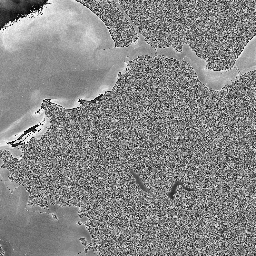

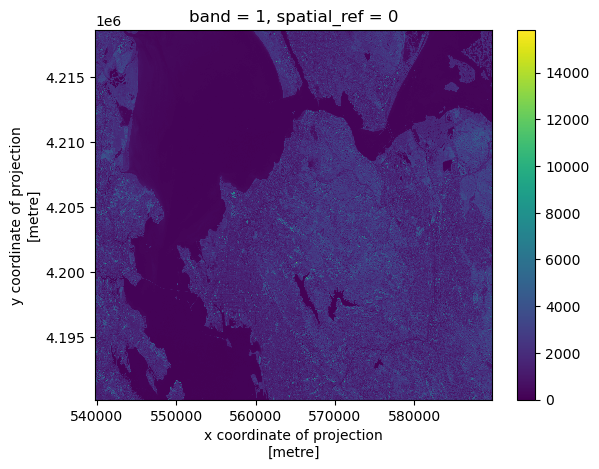

In [96]:
import torchvision.transforms as T

side_length = 50000
side_px=256
image_rgb = None
url_rgb = 'https://sentinel2l2a01.blob.core.windows.net/sentinel2-l2/10/S/EH/2019/11/21/S2B_MSIL2A_20191121T185659_N0212_R113_T10SEH_20201003T184646.SAFE/GRANULE/L2A_T10SEH_A014153_20191121T190140/IMG_DATA/R10m/T10SEH_20191121T185659_TCI_10m.tif?st=2022-11-27T23%3A55%3A49Z&se=2022-11-29T07%3A55%3A49Z&sp=rl&sv=2021-06-08&sr=c&skoid=c85c15d6-d1ae-42d4-af60-e2ca0f81359b&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2022-11-28T21%3A44%3A55Z&ske=2022-12-05T21%3A44%3A55Z&sks=b&skv=2021-06-08&sig=R4Hwm2SxloOG%2BVIj53DhSUCcv0QF/rSOrA8xLBhee5U%3D'
url_nir = 'https://sentinel2l2a01.blob.core.windows.net/sentinel2-l2/10/S/EH/2019/11/21/S2B_MSIL2A_20191121T185659_N0212_R113_T10SEH_20201003T184646.SAFE/GRANULE/L2A_T10SEH_A014153_20191121T190140/IMG_DATA/R10m/T10SEH_20191121T185659_B08_10m.tif?st=2022-11-27T23%3A55%3A49Z&se=2022-11-29T07%3A55%3A49Z&sp=rl&sv=2021-06-08&sr=c&skoid=c85c15d6-d1ae-42d4-af60-e2ca0f81359b&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2022-11-28T21%3A44%3A55Z&ske=2022-12-05T21%3A44%3A55Z&sks=b&skv=2021-06-08&sig=R4Hwm2SxloOG%2BVIj53DhSUCcv0QF/rSOrA8xLBhee5U%3D'
postprocess = T.Compose ([T.Resize(side_px), 
                         T.CenterCrop((side_px,side_px))])

to_pil = T.ToPILImage()

with rasterio.Env():
    with rasterio.open(url_nir, "r") as f:
        
        point_geom = rasterio.warp.transform_geom("epsg:4326", f.crs.to_string(), berkeley)
        print(f.crs.to_string())
        #Convert the point to a shape
        point_shape = shapely.geometry.shape(point_geom)
        #Create a square out of it with side_length = buffer*2
        mask_shape = point_shape.buffer(side_length/2).envelope
        mask_geom = shapely.geometry.mapping(mask_shape)
        
        # mask_gdf = gpd.GeoDataFrame(geometry=mask_geom, crs=f.crs.to_string())  
        # mask_gdf
        # mask_geom
        # rds = rioxarray.open_rasterio(f) #, masked=True)
        try:

            image_rgb = rioxarray.open_rasterio(f).rio.clip([mask_geom], from_disk=True)
            image_rgb.sel(band=1).plot.imshow()
            # image_rgb.plot.imshow()
            print(image_rgb.shape)
            # image_rgb.plot.imshow()
            #Convert to torch
            # RGB
            # t = torch.from_numpy(image_rgb.values).float()
            
            #NIR
            t = torch.from_numpy(image_rgb.values.astype(np.uint8))
            
            postprocess = T.Compose ([T.CenterCrop((t.shape[1])),
                                     T.Resize(side_px)])
            # t = T.CenterCrop(size=(t.shape[1]))(t)
            # t = T.Resize(size=500, antialias=True)(t)
            # t = F.resize(t, (1024,1024))
            t = postprocess(t)
            #otherwise images dont display properly
            #but uint8 conversion has already taken care of this downresolution
            # t /= 255 
            print(t.shape, type(t))
#             #only for display
            display = to_pil(t)
            display.show()
            
        except ValueError as e:
            print("Couldnt open URL ({:} or requested grid doesnt overlap)")


## Testing Raster Retrieval and Reproject with Rioxarray

In [170]:
BUCKET_NAME = 'datasets-sdm'
folder = 'geoLifeCLEF/rasters'
s3_raster_path = 's3://{}/{}/'.format(BUCKET_NAME, folder)
# filename = s3_raster_path + "{}/{}_{}.tif".format("bio_11", "bio_11", "USA")
filename = "{}_{}.tif".format("bio_11", "USA")

MIN_ALLOWED_VALUE = -10000
nan = None
crs = None

with rasterio.Env():
    with rasterio.open(filename, "r") as dataset:
        with rasterio.vrt.WarpedVRT(dataset, crs="EPSG:32610") as src:
            # self.dataset = dataset
            raster = src.read(1, masked=True, out_dtype=src.dtypes[0])
            

            x_min = src.bounds.left
            y_min = src.bounds.bottom
            x_resolution = src.res[0]
            y_resolution = src.res[1]
            n_rows = src.height
            n_cols = src.width
            crs = src.crs

            # loading the raster
            # raster = np.squeeze(src.read())
            src.close()

            # raster = raster.astype(float)

            # value bellow min_value are considered incorrect and therefore no_data
            raster[raster < MIN_ALLOWED_VALUE] = None
            raster[np.isnan(raster)] = None
            #convert to 0-255, and then to uint8
            raster = (255 * (raster - np.nanmin(raster)) / (np.nanmax(raster) - np.nanmin(raster))).astype(np.uint8)
            raster = raster.filled(0)


In [171]:
raster, crs

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 CRS.from_epsg(32610))

In [174]:
crs.data['init']

'epsg:32610'

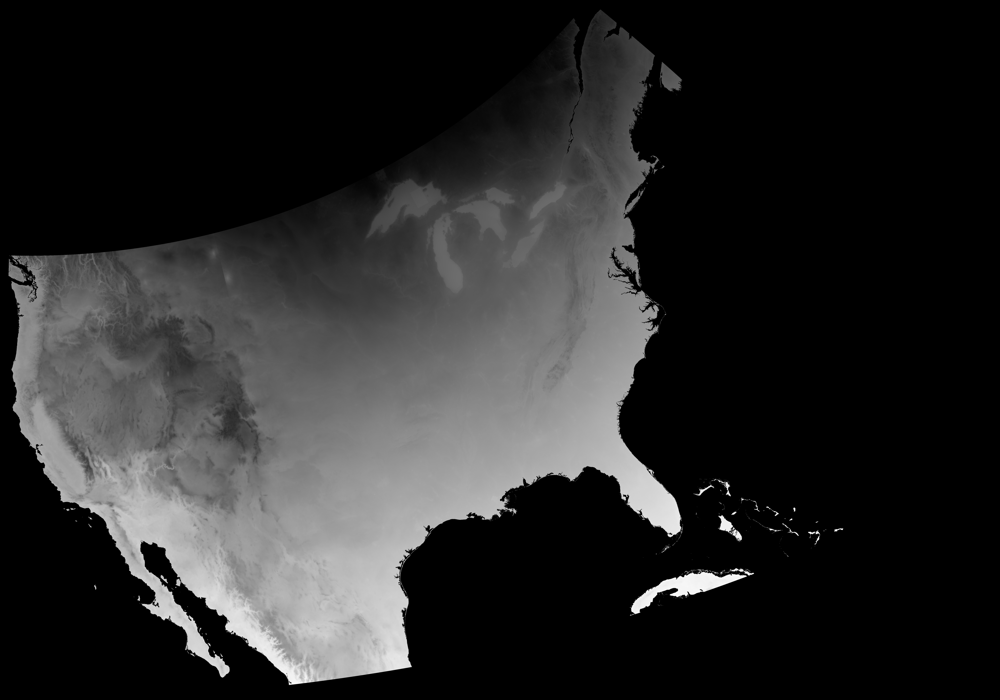

In [167]:
t = torch.from_numpy(raster)
display = to_pil(t)
display.show()

In [168]:
np.nanmax(raster), np.nanmin(raster), np.nanstd(raster), np.nanmean(raster)

(254, 0, 62.41643526401018, 40.12806097540135)

In [169]:
raster.shape

(5509, 7860)

### Alternative implementation

In [196]:
raster = None
with rasterio.Env():
    with rasterio.open(filename, "r") as f:
    
        raster = rioxarray.open_rasterio(f)#.rio.clip([mask_geom], from_disk=True)
        raster = raster.rio.reproject("EPSG:32610")
        

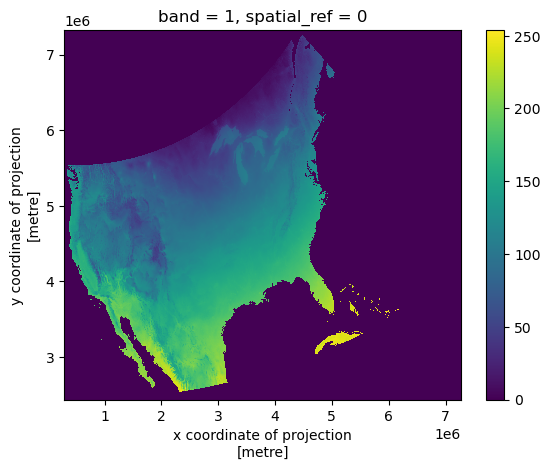

In [197]:
raster.data[raster.data < MIN_ALLOWED_VALUE] = None
raster.data[np.isnan(raster.data)] = None
#convert to 0-255, and then to uint8
raster.data = (255 * (raster.data - np.nanmin(raster.data)) / (np.nanmax(raster.data) - np.nanmin(raster.data))).astype(np.uint8)
# raster.data = raster.data.filled(0)
raster.sel(band=1).plot.imshow()

In [198]:
raster.data

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint8)

In [200]:
raster

<xarray.DataArray (band: 1, y: 5509, x: 7860)>
array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint8)
Coordinates:
  * x            (x) float64 2.94e+05 2.949e+05 ... 7.274e+06 7.275e+06
  * y            (y) float64 7.326e+06 7.325e+06 ... 2.434e+06 2.433e+06
  * band         (band) int64 1
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:       Area
    STATISTICS_MAXIMUM:  24.14999961853
    STATISTICS_MEAN:     -0.26365099054799
    STATISTICS_MINIMUM:  -18.516666412354
    STATISTICS_STDDEV:   8.5912566889401
    scale_factor:        1.0
    add_offset:          0.0
    _FillValue:          -3.4e+38

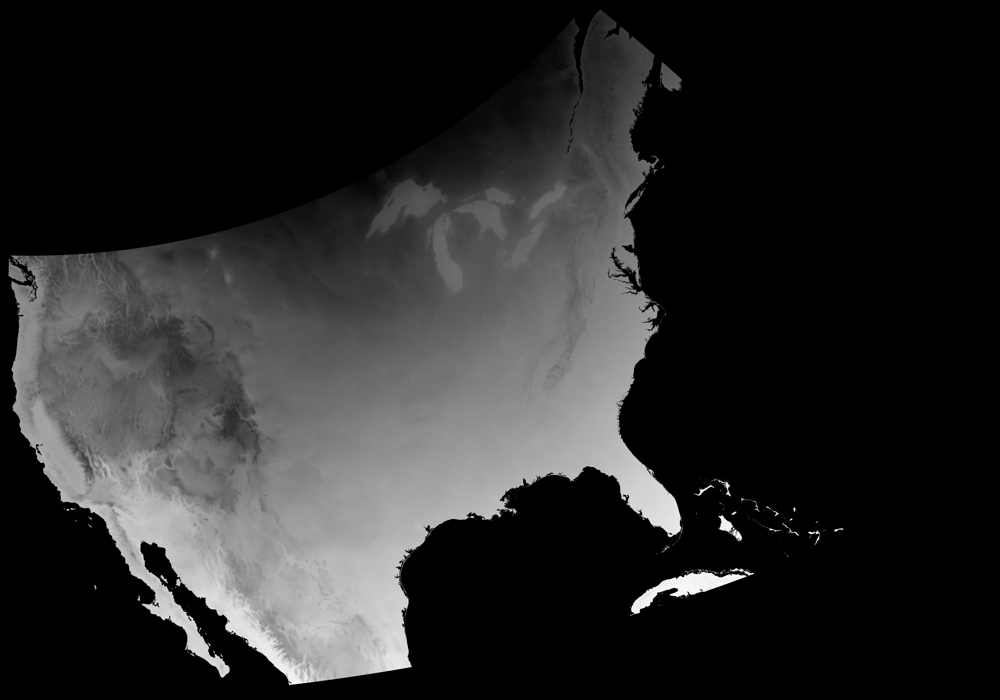

In [201]:
t = torch.from_numpy(raster.data)
display = to_pil(t)
display.show()

In [204]:
raster.attrs

{'AREA_OR_POINT': 'Area',
 'STATISTICS_MAXIMUM': 24.14999961853,
 'STATISTICS_MEAN': -0.26365099054799,
 'STATISTICS_MINIMUM': -18.516666412354,
 'STATISTICS_STDDEV': 8.5912566889401,
 'scale_factor': 1.0,
 'add_offset': 0.0,
 '_FillValue': -3.4e+38}

In [205]:
raster.dims

('band', 'y', 'x')

In [208]:
raster.rio.crs.to_string()

'EPSG:32610'

In [212]:
raster.shape

(1, 5509, 7860)